# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

As a used car dealer, it is important to understand what factors are the differentiators that make a car more or less expensive. As a result of exploring the data provided (426,000 used car sales records), I will need to guide the dealer through different reports to make good decisions on how to improve their inventory and/or potentially their sales.

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

As a first step, It is important to understand the data provided. The original data used into my process is of a size of 426K sale records of used cars.

Steps to explore the data:

1. Import the data
2. To identify each column, possible values, min, max and others
3. To identify missing values
4. Remove or adjust data set around missed values
5. Transform categorical columns using Target encoder
6. To identify relations of each column by executing correlations
7. To explore the importance of each column with the price

In [40]:
# Libraries Import
from sklearn.linear_model import Ridge, LinearRegression, Lasso
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import set_config
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.inspection import permutation_importance
from ydata_profiling import ProfileReport
from category_encoders import TargetEncoder
from sklearn.feature_selection import SequentialFeatureSelector

import plotly.express as px
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import warnings

set_config(display="diagram")

In [41]:
warnings.filterwarnings('ignore')

In [42]:
# 1) Import data
data = pd.read_csv('data/vehicles.csv')
data.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc


In [43]:
# 1.1) Exploring the original data set and columns provider. This is an easy way to identify Dtype
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [44]:
# 2) Using a tool to generate a complete report over the data
profile = ProfileReport(data)
profile.to_file(output_file='data/output.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [45]:
# 2.1) Generate the report
profile

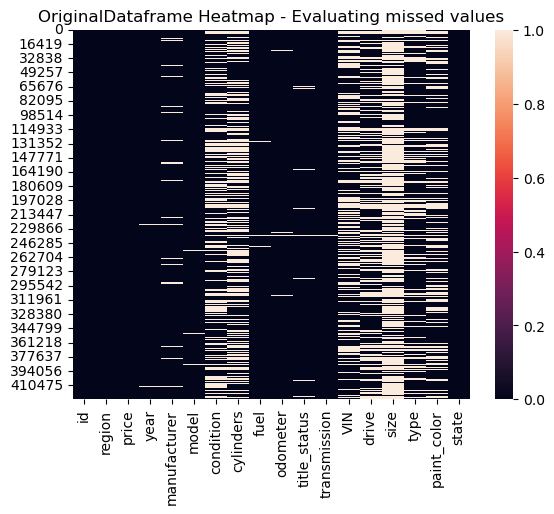

In [46]:
# 2.2) Missed data plot. Visual representation of missed values and columns
ax = sns.heatmap(
	data.isna()
)
ax.set_title("OriginalDataframe Heatmap - Evaluating missed values")
plt.show()

#### Columns - Identification and action to be performed based on report:

- id:
    - This is an unique value. 
    - Action: Delete this column as we can't use this into regressions

- region:
    - Name of the region where reported the transaction. 0% of missed records
    - Action: None

- price:
    - Sales price for the car. 7.7% of the records are with zero. 
    - Action: Remove records with zero value as this is necessary for predictions

- year:
    - Year of the car. 0.3% missed records
    - Action: Filling with the most common value

- manufacturer:
    - Name of the manufacturer. 4.1% of records missed
    - Action: Filling with "Other" as this is a categorical column

- model:
    - Name of the model for car sold. 1.2% of records missed  
    - Action: Filling with "Other" as this is a categorical column
        - Re-label content by using the first word

- condition:
    - Status of car when sold. Missed records 40.8%
    - Action: Filling with the most common value

- cylinders:
    - Missed record 41.6 %
    - Action: Remove the word cylinders, Replace others and missed values by filling with the most common value

- fuel:
    - Missed records 0.7%
    - Action: Filling with "Other" as this is a categorical column

- odometer: 
    - Odometer when sold vehicle. 1% missed
    - Action: Filling with odometer mean

- title_status:
    - This represents the status of the title of car. 1.9%
    - Action: Filling with the most common value

- transmission:
    - Missed records 0.6 %
    - Action: Filling with "Other" as this is a categorical column

- VIN:
    - Must be an unique value by car. Missed 37.7%
    - Action: Remove column as we can't use into regressions

- drive:
    - Missed records 30.6%
    - Action: Filling with "Other" as this is a categorical column

- size: 
    - Classification for size of vehicle. There are 71.8% of records missed. 
    - Action: Filling with "Other" as this is a categorical column

- type:
    - Missed records 21.8%
    - Action: Filling with "Other" as this is a categorical column

- paint_color
    - Missed records 30.5%
    - Action: Filling with "Other" as this is a categorical column, replace "7" with "other"

- state:
    - Administrative area - State
    - Action: None

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

#### Missing values - Treatment

In [47]:
# Removing records with price = 0
df_clean = data.query('price > 0')

# Droping id as this is an unique value
# Droping VIN because this should be unique and we can't use it into regressions
# Droping region as exists state representing the location
df_clean = df_clean.drop(['id', 'VIN', 'region', 'size', 'paint_color', 'drive'], axis=1)

# Filling criteria:
df_clean["year"] = df_clean["year"].fillna(df_clean["year"].mode()[0])
df_clean['year'] = df_clean['year'].apply(lambda x: int(x))
df_clean["manufacturer"] = df_clean["manufacturer"].fillna('other')
df_clean["model"] = df_clean["model"].fillna('other')
df_clean["condition"] = df_clean["condition"].fillna(df_clean["condition"].mode()[0])
df_clean["cylinders"] = df_clean['cylinders'].str.replace(' cylinders', '')
df_clean["cylinders"] = df_clean["cylinders"].fillna(df_clean["cylinders"].mode()[0])
df_clean["cylinders"] = df_clean['cylinders'].str.replace('other', df_clean["cylinders"].mode()[0])
df_clean["cylinders"] = pd.to_numeric(df_clean['cylinders'])
df_clean["fuel"] = df_clean["fuel"].fillna('other')
df_clean["odometer"] = df_clean["odometer"].fillna(df_clean["odometer"].mean())
df_clean["title_status"] = df_clean["title_status"].fillna(df_clean["title_status"].mode()[0])
df_clean["transmission"] = df_clean["transmission"].fillna('other')
# df_clean["drive"] = df_clean["drive"].fillna('other')
# df_clean["size"] = df_clean["size"].fillna('other')
df_clean["type"] = df_clean["type"].fillna('other')
# df_clean["paint_color"] = df_clean["paint_color"].fillna('other')
# df_clean["paint_color"] = df_clean["paint_color"].str.replace('7', 'other')

# Function used to extract the first word of the model
def first_words(item):
    model = item["model"]
    segments = re.split(r"[, \!?:]+", model)
    index = 0
    value = segments[index]

    # If the model is compound with the manufacturer name
    if(value == item["manufacturer"]): 
        index += 1 
        if(len(segments) > index):
            value = segments[index]   

    return value.title() 

df_clean['model'] = df_clean['model'].str.replace('-', '')
df_clean['model'] = df_clean.apply(first_words, axis=1)


# Removing inaccurate records: First vehicle with automstic transmission started at 1948
df_clean = df_clean.query('not(year < 1948 and transmission == "automatic")')

# Removing duplicated records
df = df_clean.drop_duplicates()

df.sample(10)


,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,type,state
227897,59999,2019,jeep,Wrangler,good,6,gas,4481.0,clean,automatic,SUV,mt
361741,42902,2016,ram,3500,good,6,diesel,188929.0,clean,automatic,other,tn
289895,12495,2015,mazda,Mazda3,good,6,gas,69482.0,clean,automatic,sedan,oh
331571,18995,2016,ford,F150,like new,8,gas,113470.0,clean,automatic,pickup,pa
169709,3500,2002,chevrolet,Monte,good,6,gas,186837.0,clean,automatic,other,ks
388,26990,2020,nissan,Frontier,good,6,gas,323.0,clean,automatic,other,al
56675,5950,2010,subaru,Impreza,excellent,4,gas,125997.0,clean,automatic,sedan,ca
114698,3650,2010,ford,Crown,good,8,gas,166000.0,clean,automatic,sedan,fl
117585,7799,2005,jeep,Grand,good,8,gas,114200.0,clean,manual,SUV,fl
164393,7500,2013,honda,Civic,good,4,gas,95000.0,rebuilt,automatic,other,ks


In [48]:
# Re-evaluating dataset looking for missed values and others using report
profile_clean = ProfileReport(df)
profile_clean.to_file(output_file='data/output_cleared.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [49]:
# Generating report over cleared data
profile_clean

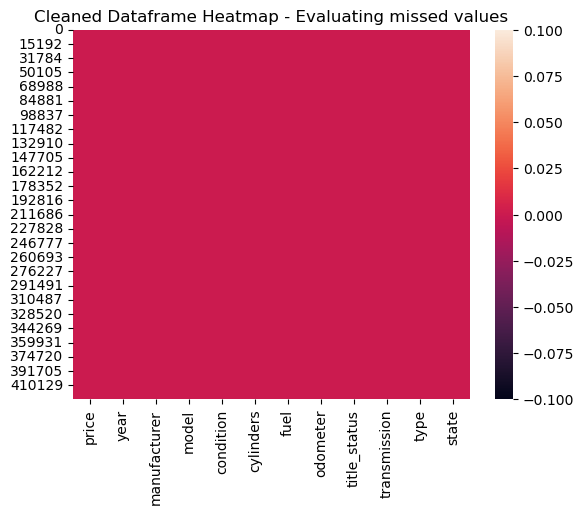

In [50]:
# Re-evaluating missed values using heatmap
ax = sns.heatmap(
	df.isna()
)
ax.set_title("Cleaned Dataframe Heatmap - Evaluating missed values")
plt.show()

#### Identifying Outliers for Price column

We can use the IQR to determine boundaries for outliers.  One such rule of thumb is that any values $1.5 \times IQR$ above the third quartile or below the first are considered outliers.  

Calculate the lower and upper boundaries for outliers for the `price` column using the IQR rule.

In [51]:
# Function to detect Outliers and return the DF filtered
def outliers_filter(df, column):
    factor = 1.5
    first_quartile = df[column].quantile(.25)
    third_quartile = df[column].quantile(.75)
    iqr = third_quartile - first_quartile
    lower = first_quartile - factor*iqr
    upper = third_quartile + factor*iqr
    print( f' lower: { lower }, upper: { upper }')
    return

outliers_filter(df, 'price')

# Redefine outliers using approximated values based on suggested results
lower = 100
upper = 70000
df_without_outliers = df.query( f'price > { lower } and price < { upper }' )

 lower: -21250.0, upper: 52750.0


[Text(0.5, 1.0, 'Price Distribution without outliers')]

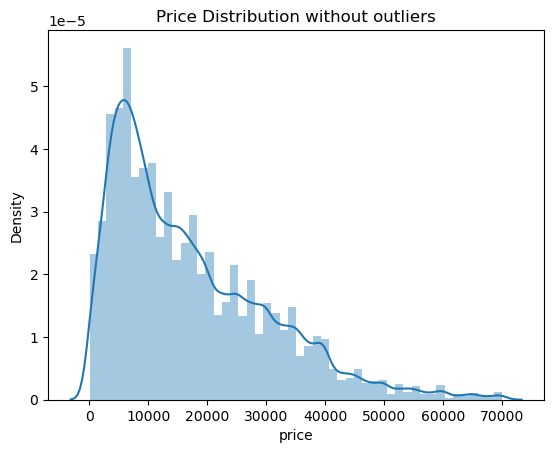

In [52]:
# Visualization to review price distributions without outliers
sns.distplot(
    df_without_outliers['price']
).set(title = "Price Distribution without outliers")

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [53]:
# Defining variable to collect results from different regressions
results = []

#### Build train and test set

In [54]:
# Splitting the dataset into Train and Test
X = df_without_outliers.drop('price', axis = 1)
y = df_without_outliers['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

# Colums used into regressions excluding my objective (price)
features = X.columns

# Get categorical columns
cat_columns = df_without_outliers.select_dtypes(include='object').columns
cat_columns



Index(['manufacturer', 'model', 'condition', 'fuel', 'title_status',
       'transmission', 'type', 'state'],
      dtype='object')

#### Simple Linear Regression

In [55]:
# Enconding columns to apply regression
target_encoder = TargetEncoder()
df_target_encoded = target_encoder.fit_transform(df_without_outliers[features], df_without_outliers["price"])

X1 = df_target_encoded
y1 = df_without_outliers["price"]
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size = 0.3, random_state = 42)

# Training the model with LinearRegression
first_degree_model = LinearRegression().fit(X1_train, y1_train)

# Executing predictions
pred_train = first_degree_model.predict(X1_train[features])
pred_test = first_degree_model.predict(X1_test[features])

# Obtaining errors for training and test datasets
train_mse = mean_squared_error(y_train, pred_train)
test_mse = mean_squared_error(y_test, pred_test)

train_r2 = r2_score(y_train, pred_train)
test_r2 = r2_score(y_test, pred_test)

# Collection results
reg_results = {
    'model': 'simpleRegression',
    'train_mse': train_mse,
    'test_mse': test_mse,
    'train_r2': train_r2,
    'test_r2': test_r2
}
results.append(reg_results)


#### Perform a Linear Regression with Polynomial Features

In [56]:
# Using GridSearchCV, including Target encoder and polynomial features
column_transformer = make_column_transformer(
    (TargetEncoder(), cat_columns),
    (PolynomialFeatures(), make_column_selector(dtype_include=np.number))
)

# Defining a pipeline doing columns transformations, scaling data and performing LinearRegression
pipe = Pipeline([
    ('transformer', column_transformer), 
    ('scaler', StandardScaler()),
    ('linreg', LinearRegression())
])

# Different degrees to use over the PolynomialFeatures function
param_dict = {
    'transformer__polynomialfeatures__degree': [1, 2, 3, 4, 5]
}
gscv_linreg = GridSearchCV(
    pipe, 
    param_grid=param_dict
)

# Training the model
gscv_linreg.fit(X_train[features], y_train)


GridSearchCV(estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(transformers=[('targetencoder',
                                                                         TargetEncoder(),
                                                                         Index(['manufacturer', 'model', 'condition', 'fuel', 'title_status',
       'transmission', 'type', 'state'],
      dtype='object')),
                                                                        ('polynomialfeatures',
                                                                         PolynomialFeatures(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x35cf9f510>)])),
                                       ('scaler', StandardScaler()),
                                       ('linreg', LinearRegression())]),
             param_grid={'transformer__polynomialfeatures__degree': [1, 2, 3, 4,
                                                                     5]})

In [57]:
# Obtaining predictions
pred_train = gscv_linreg.best_estimator_.predict(X_train[features])
pred_test = gscv_linreg.best_estimator_.predict(X_test[features])

# Evaluating the errors
train_mse = mean_squared_error(y_train, pred_train)
test_mse = mean_squared_error(y_test, pred_test)

train_r2 = r2_score(y_train, pred_train)
test_r2 = r2_score(y_test, pred_test)

# Reporting results for this regression model
reg_results = {
    'model': 'linearRegressionWithPF',
    'train_mse': train_mse,
    'test_mse': test_mse,
    'train_r2': train_r2,
    'test_r2': test_r2
}
results.append(reg_results)

#### Ridge Regression with Polynomial Features

In [58]:
## Making transformations (TargetEncoder) and including polynomial features
column_transformer = make_column_transformer(
    (PolynomialFeatures(), make_column_selector(dtype_include=np.number)),                                 
    (TargetEncoder(), cat_columns),
)

# Pipeline to transform, scale and to execute a ridge regression
pipe = Pipeline([
    ('transformer', column_transformer), 
    ('scaler', StandardScaler()),
    ('ridge', Ridge())
])

# Possible values to evaluate over the polynomicl features. In this case iterating with polynomical features and alpha
param_dict = {
    'transformer__polynomialfeatures__degree': [1, 2, 3, 4, 5],
    'ridge__alpha': np.logspace(0, 5, 10)
}
gscv_ridge = GridSearchCV(
    pipe, 
    param_grid=param_dict
)

# Training the model
gscv_ridge.fit(X_train[features], y_train)

GridSearchCV(estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(transformers=[('polynomialfeatures',
                                                                         PolynomialFeatures(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x3918901d0>),
                                                                        ('targetencoder',
                                                                         TargetEncoder(),
                                                                         Index(['manufacturer', 'model', 'condition', 'fuel', 'title_status',
       'transmission', 'type', 'state'],
      dtype='object'))])),
                                       ('scaler', StandardScaler()),
                                       ('ridge', Ridge())]),
             param_grid={'ridge__alpha': array([1.00000000e+00, 3.59381366e+00, 1.29154967e+01, 4.64158883e+01,
       1.66810054e+02, 5.99484250e+02, 2.15443469e+03, 7.74263683e+03,
       2.78255940e+04, 1.00000000e+05]),
                         'transformer__polynomialfeatures__degree': [1, 2, 3, 4,
                                                                     5]})

In [59]:
# Obtaining predictions
pred_train = gscv_ridge.best_estimator_.predict(X_train[features])
pred_test = gscv_ridge.best_estimator_.predict(X_test[features])

# Evaluating error
train_mse = mean_squared_error(y_train, pred_train)
test_mse = mean_squared_error(y_test, pred_test)

train_r2 = r2_score(y_train, pred_train)
test_r2 = r2_score(y_test, pred_test)

# Reporting results
reg_results = {
    'model': 'ridgeRegressionWithPF',
    'train_mse': train_mse,
    'test_mse': test_mse,
    'train_r2': train_r2,
    'test_r2': test_r2,
    'hyperParams': gscv_ridge.best_params_
}
results.append(reg_results)

In [60]:
results

[{'model': 'simpleRegression',
  'train_mse': 89023431.40555929,
  'test_mse': 90190746.82375182,
  'train_r2': 0.49457319215105733,
  'test_r2': 0.4889205050651295},
 {'model': 'linearRegressionWithPF',
  'train_mse': 56002406.097316764,
  'test_mse': 57296597.43804505,
  'train_r2': 0.6820486820298033,
  'test_r2': 0.6753201729513685},
 {'model': 'ridgeRegressionWithPF',
  'train_mse': 60451805.31222538,
  'test_mse': 61879961.33870584,
  'train_r2': 0.6567874041108259,
  'test_r2': 0.6493478488499835,
  'hyperParams': {'ridge__alpha': 1.0,
   'transformer__polynomialfeatures__degree': 5}}]

#### Lasso Regression with polynomial features

In [61]:
## Using transformations cover categorical columns
column_transformer = make_column_transformer(
    (PolynomialFeatures(), make_column_selector(dtype_include=np.number)),                                 
    (TargetEncoder(), cat_columns),
)

# Using a pipelne to perform a lasso regression over scaled and transformed data
pipe = Pipeline([
    ('transformer', column_transformer), 
    ('scaler', StandardScaler()),
    ('lasso', Lasso(random_state = 42))
])

# Parameters used over the polynomial features
param_dict = {
    'transformer__polynomialfeatures__degree': [1, 2, 3, 4, 5]
}
gscv_lasso = GridSearchCV(
    pipe, 
    param_grid=param_dict
)

# Training the model
gscv_lasso.fit(X_train[features], y_train)

GridSearchCV(estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(transformers=[('polynomialfeatures',
                                                                         PolynomialFeatures(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x386d4b850>),
                                                                        ('targetencoder',
                                                                         TargetEncoder(),
                                                                         Index(['manufacturer', 'model', 'condition', 'fuel', 'title_status',
       'transmission', 'type', 'state'],
      dtype='object'))])),
                                       ('scaler', StandardScaler()),
                                       ('lasso', Lasso(random_state=42))]),
             param_grid={'transformer__polynomialfeatures__degree': [1, 2, 3, 4,
                                                                     5]})

In [62]:
# Obtaining predictions
pred_train = gscv_lasso.best_estimator_.predict(X_train[features])
pred_test = gscv_lasso.best_estimator_.predict(X_test[features])

# Getting errors
train_mse = mean_squared_error(y_train, pred_train)
test_mse = mean_squared_error(y_test, pred_test)

train_r2 = r2_score(y_train, pred_train)
test_r2 = r2_score(y_test, pred_test)

# Reporting results
reg_results = {
    'model': 'lassoRegressionWithPF',
    'train_mse': train_mse,
    'test_mse': test_mse,
    'train_r2': train_r2,
    'test_r2': test_r2,
    'hyperParams': gscv_lasso.best_params_
}
results.append(reg_results)

In [63]:
results

[{'model': 'simpleRegression',
  'train_mse': 89023431.40555929,
  'test_mse': 90190746.82375182,
  'train_r2': 0.49457319215105733,
  'test_r2': 0.4889205050651295},
 {'model': 'linearRegressionWithPF',
  'train_mse': 56002406.097316764,
  'test_mse': 57296597.43804505,
  'train_r2': 0.6820486820298033,
  'test_r2': 0.6753201729513685},
 {'model': 'ridgeRegressionWithPF',
  'train_mse': 60451805.31222538,
  'test_mse': 61879961.33870584,
  'train_r2': 0.6567874041108259,
  'test_r2': 0.6493478488499835,
  'hyperParams': {'ridge__alpha': 1.0,
   'transformer__polynomialfeatures__degree': 5}},
 {'model': 'lassoRegressionWithPF',
  'train_mse': 67108603.6423387,
  'test_mse': 68310355.8637127,
  'train_r2': 0.6189937100534068,
  'test_r2': 0.6129090466245763,
  'hyperParams': {'transformer__polynomialfeatures__degree': 5}}]

#### Linear Regression with Sequential Feature Selector

In [64]:
# Exeucting transformation, preparing data
column_transformer = make_column_transformer(
    (PolynomialFeatures(), make_column_selector(dtype_include=np.number)),                                 
    (TargetEncoder(), cat_columns),
)

# Pipeline use to apply a Linear regression and SequentialFeatureSelector once data has being transformed
pipe = Pipeline([
    ('transformer', column_transformer), 
    ('selector', SequentialFeatureSelector(LinearRegression())),
    ('model', LinearRegression())
])

# Params to iterate over the selector
param_dict = {'selector__n_features_to_select': [2, 3, 4, 5]}
gscv_sf = GridSearchCV(pipe, param_grid=param_dict)

# Training the model
gscv_sf.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(transformers=[('polynomialfeatures',
                                                                         PolynomialFeatures(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x386d4b9d0>),
                                                                        ('targetencoder',
                                                                         TargetEncoder(),
                                                                         Index(['manufacturer', 'model', 'condition', 'fuel', 'title_status',
       'transmission', 'type', 'state'],
      dtype='object'))])),
                                       ('selector',
                                        SequentialFeatureSelector(estimator=LinearRegression())),
                                       ('model', LinearRegression())]),
             param_grid={'selector__n_features_to_select': [2, 3, 4, 5]})

In [66]:
# Obtaining predictions
pred_train = gscv_sf.best_estimator_.predict(X_train[features])
pred_test = gscv_sf.best_estimator_.predict(X_test[features])

# Calculating errors
train_mse = mean_squared_error(y_train, pred_train)
test_mse = mean_squared_error(y_test, pred_test)

train_r2 = r2_score(y_train, pred_train)
test_r2 = r2_score(y_test, pred_test)

# Reporting results
reg_results = {
    'model': 'linearRegressionWithSFS',
    'train_mse': train_mse,
    'test_mse': test_mse,
    'train_r2': train_r2,
    'test_r2': test_r2,
    'hyperParams': gscv_sf.best_params_
}
results.append(reg_results)

In [80]:
# Final results obtained by executing different regression models
df_results = pd.DataFrame(results)
df_results

,model,train_mse,test_mse,train_r2,test_r2,hyperParams
0,simpleRegression,8.902343e+07,9.019075e+07,0.494573,0.488921,NaN
1,linearRegressionWithPF,5.600241e+07,5.729660e+07,0.682049,0.675320,NaN
2,ridgeRegressionWithPF,6.045181e+07,6.187996e+07,0.656787,0.649348,"{'ridge__alpha': 1.0, 'transformer__polynomial..."
3,lassoRegressionWithPF,6.710860e+07,6.831036e+07,0.618994,0.612909,{'transformer__polynomialfeatures__degree': 5}
4,linearRegressionWithSFS,7.330788e+07,7.464045e+07,0.583798,0.577039,{'selector__n_features_to_select': 5}


In [90]:
data_pred = df_without_outliers.copy() 
features = data_pred.drop(['price'], axis=1)
price = data_pred['price']

data_pred['prediction'] = gscv_linreg.best_estimator_.predict(features)

import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x= features['year'], 
        y= data_pred['price'],
        mode = 'markers',
        name = 'actual'
    )
)

fig.update_layout(font_size = 20)


### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

#### Comparing results

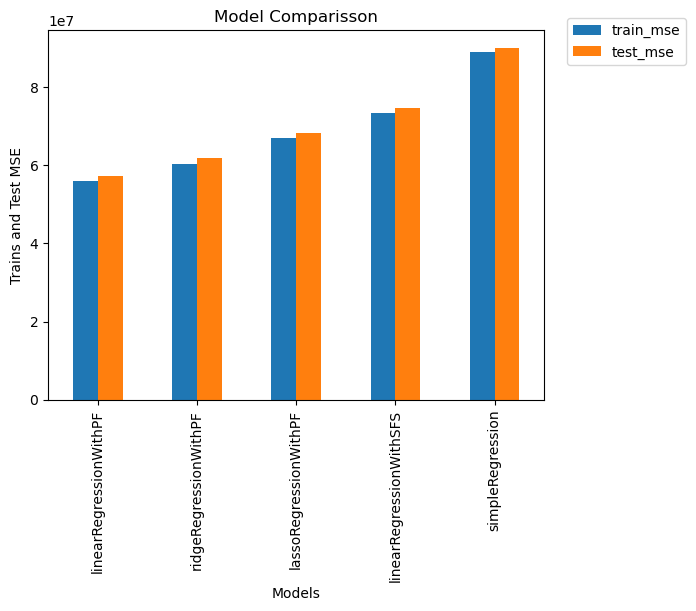

In [81]:
# Plotting the results obtained by executing different regression models. Comparing train mse and test mse
df_results[['model', 'train_mse', 'test_mse']].sort_values('test_mse', ascending=True).plot(x='model', kind='bar', stacked=False)

plt.xlabel("Models")
plt.ylabel("Trains and Test MSE")
plt.title('Model Comparisson')
plt.legend(bbox_to_anchor=(1.3, 1.05))

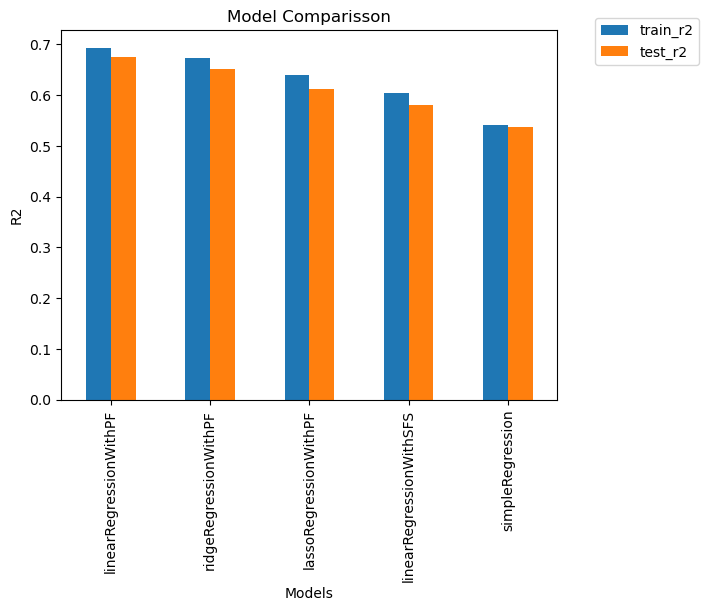

In [ ]:
# Comparing final results for train r2 and test r2 by using visualization
df_results = pd.DataFrame(results)
df_results[['model', 'train_r2', 'test_r2']].sort_values('test_r2', ascending=False).plot(x='model', kind='bar', stacked=False)

plt.xlabel("Models")
plt.ylabel("R2")
plt.title('Model Comparisson')
plt.legend(bbox_to_anchor=(1.3, 1.05))

#### Permutation Importance

In [69]:
# Evaluating what are the most important features.
scoring = [ 'neg_mean_squared_error']

# I'm using the best model and the best estimator obtained by this
r_multi = permutation_importance(
            gscv_linreg.best_estimator_, 
            X_test, 
            y_test, 
            n_repeats=30, 
            random_state=21, 
            scoring=scoring
        )

In [70]:
# Improving the resulting data obtained by generating a sorted DataFrame with importance
importances_tr = dict(
        zip(
                X_train.columns, 
                r_multi['neg_mean_squared_error'].importances_mean
        )
)
importances_tr = {k : v for k ,v in sorted(importances_tr.items(), key = lambda x: x[1], reverse = True)}
import_df = pd.DataFrame(importances_tr.values(), index=importances_tr.keys(), columns = ['Importances'])
display(import_df)

,Importances
year,7.069347e+07
model,3.681350e+07
odometer,1.425366e+07
cylinders,1.213318e+07
fuel,6.787612e+06
title_status,1.192977e+06
type,1.147388e+06
state,9.269779e+05
transmission,6.888794e+05
manufacturer,5.266467e+05


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'year'),
  Text(1, 0, 'model'),
  Text(2, 0, 'odometer'),
  Text(3, 0, 'cylinders'),
  Text(4, 0, 'fuel'),
  Text(5, 0, 'drive'),
  Text(6, 0, 'title_status'),
  Text(7, 0, 'state'),
  Text(8, 0, 'type'),
  Text(9, 0, 'transmission'),
  Text(10, 0, 'condition'),
  Text(11, 0, 'manufacturer'),
  Text(12, 0, 'paint_color'),
  Text(13, 0, 'size')])

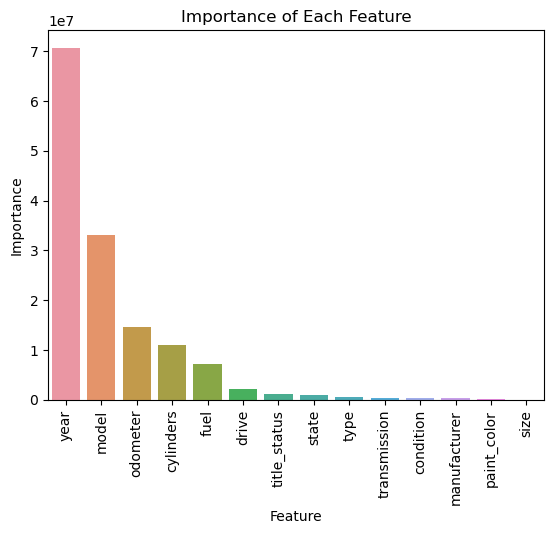

In [ ]:
# Visualization of the importance of each feature vs the price
df_importances = import_df.reset_index()

sns.barplot(data = df_importances, x="index", y="Importances")

plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title('Importance of Each Feature')
plt.xticks(rotation=90)  # Rotate labels by 45 degrees


#### Correlation using feature importance

[Text(0.5, 1.0, 'Correlation Heatmap')]

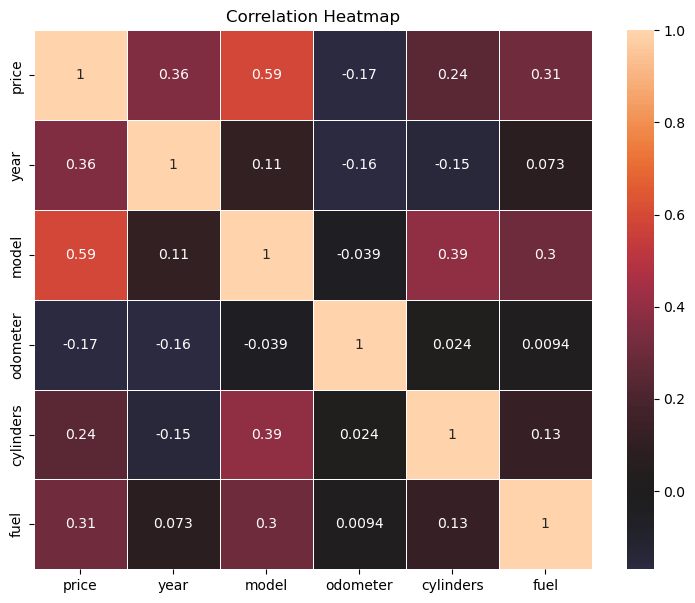

In [71]:
# Correlation using the TOP 5 features identified as most important
features_importance = ["price", "year", "model", "odometer", "cylinders" , "fuel"]
target_encoder = TargetEncoder()
df_target_encoded = target_encoder.fit_transform(df_without_outliers[features_importance], df_without_outliers["price"])

f, ax = plt.subplots(figsize=(9, 7))
sns.heatmap(df_target_encoded.corr(), 
    center = 0, 
    linewidth = .7, 
    annot = True
).set(title='Correlation Heatmap')

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.

In [72]:
df = df_without_outliers.copy()

df.sample(10)

,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,type,state
280468,6500,2007,chevrolet,Tahoe,good,6,gas,220000.0,clean,automatic,other,ny
96879,22975,2013,ford,F150,good,6,gas,103982.0,clean,automatic,pickup,fl
137096,11995,2004,ram,1500,good,8,gas,149935.0,clean,automatic,pickup,id
161327,26995,2015,ram,1500,good,6,gas,108000.0,clean,automatic,other,ia
376393,16993,2014,mercedes-benz,Eclass,good,6,gas,94940.0,clean,automatic,sedan,tx
273421,24590,2020,mini,Hardtop,good,6,gas,9495.0,clean,other,hatchback,ny
358794,9994,2012,kia,Sorento,good,6,gas,98083.0,clean,automatic,other,tn
85394,15950,2016,toyota,Camry,excellent,6,gas,59800.0,clean,automatic,sedan,ct
352272,12500,2014,ford,Focus,like new,4,gas,17237.0,clean,automatic,sedan,tn
222283,17995,2016,toyota,Camry,good,4,gas,61000.0,clean,automatic,sedan,mo


In [73]:
# Categorizing the data to improve visualizations. Using year and odometer
# - year    --> year_category: Using the descriptive categories below
# - odomter --> odomter_category: Classifying by using odometer ranges

# Vintage Car: Manufactured between 1919 and 1930. Either a “survivor” or restored in conformance to the original manufacturer specifications
# Antique Car: Manufactured 1975 or earlier (>45 years old). Either a “survivor” or restored in conformance to the original manufacturer specifications
# Classic Car: Manufactured 2000 or earlier (>20 years old)
# Modern Car : Manufactured 2000 or earlier (>10 years old)
# New Model  : Manufactured 2017 or newest (5 years old) 
min_year = min(df['year'])
max_year = max(df['year'])
year_bins = [min_year, max_year - 45 , max_year - 20 , max_year - 10, max_year - 5, max_year]
year_categories = ['Vintage', 'Antique' , 'Classic', 'Modern', 'New Model']

df['year_category'] = pd.cut(
        df['year'], 
        year_bins,  
        labels = year_categories,  
        include_lowest = True
) 

# Odometer categories
max_odometer = max(df['odometer'])
odometer_bins = [ 0, 15000 , 40000 , 70000, max_odometer]
odometer_categories = ['New', 'Low' , 'Medium', 'High']

df['odometer_category'] = pd.cut(
        df['odometer'], 
        odometer_bins,  
        labels = odometer_categories,  
        include_lowest = True
) 

display(df.sample(10))
display(year_bins)
display(odometer_bins)



,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,type,state,year_category,odometer_category
253013,1500,2005,infiniti,G35,excellent,6,gas,67000.0,clean,automatic,coupe,nj,Classic,Medium
107819,16900,2005,ford,F450,good,6,gas,42000.0,clean,automatic,other,fl,Classic,Medium
312429,28990,2003,toyota,Land,good,6,gas,165800.0,clean,automatic,wagon,or,Classic,High
2393,15590,2013,acura,Ilx,good,6,other,69626.0,clean,other,sedan,al,Modern,Medium
415497,10995,2014,hyundai,Tucson,excellent,4,gas,122130.0,clean,automatic,wagon,wi,Modern,High
262911,7000,1993,chevrolet,Suburban,good,8,gas,153000.0,clean,automatic,SUV,nm,Antique,High
149461,16700,2006,chrysler,300C,excellent,8,gas,67000.0,rebuilt,automatic,other,il,Classic,Medium
315752,6995,2007,honda,Civic,good,4,gas,147008.0,clean,automatic,sedan,or,Classic,High
133851,2995,1999,chevrolet,Suburban,good,6,gas,210000.0,clean,automatic,other,id,Antique,High
192131,201,2012,mercedes-benz,Glkclass,excellent,6,gas,140729.0,clean,automatic,SUV,ma,Classic,High


[1900, 1977, 2002, 2012, 2017, 2022]

[0, 15000, 40000, 70000, 10000000.0]

#### Sales by Year Category vs Fuel

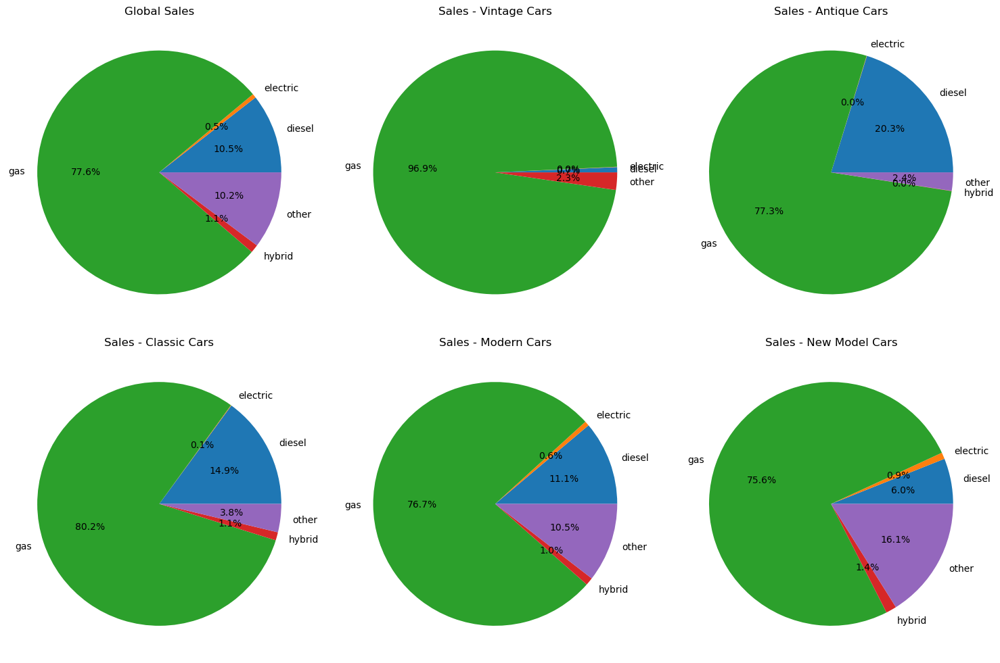

In [74]:
fig, ax = plt.subplots(2, 3, figsize = (15, 10))  # Rows, Columns, Figure size

# Original Plot
df_sales_by_fuel = df.groupby('fuel')['price'].agg(sum).reset_index()
ax[0][0].set_title('Global Sales')
ax[0][0].pie(
    df_sales_by_fuel['price'], 
	labels= df_sales_by_fuel['fuel'], 
	autopct='%1.1f%%'
)

df_sales_by_q4 = df.query('year_category == "Vintage"').groupby('fuel')['price'].agg(sum).reset_index()
ax[0][1].set_title('Sales - Vintage Cars')
ax[0][1].pie(
    df_sales_by_q4['price'], 
	labels= df_sales_by_q4['fuel'], 
	autopct='%1.1f%%'
)

df_sales_by_q3 = df.query('year_category == "Antique"').groupby('fuel')['price'].agg(sum).reset_index()
ax[0][2].set_title('Sales - Antique Cars')
ax[0][2].pie(
    df_sales_by_q3['price'], 
	labels= df_sales_by_q3['fuel'], 
	autopct='%1.1f%%'
)

df_sales_by_q2 = df.query('year_category == "Classic"').groupby('fuel')['price'].agg(sum).reset_index()
ax[1][0].set_title('Sales - Classic Cars')
ax[1][0].pie(
    df_sales_by_q2['price'], 
	labels= df_sales_by_q2['fuel'], 
	autopct='%1.1f%%'
)

df_sales_by_q2 = df.query('year_category == "Modern"').groupby('fuel')['price'].agg(sum).reset_index()
ax[1][1].set_title('Sales - Modern Cars')
ax[1][1].pie(
    df_sales_by_q2['price'], 
	labels= df_sales_by_q2['fuel'], 
	autopct='%1.1f%%'
)

df_sales_by_q2 = df.query('year_category == "New Model"').groupby('fuel')['price'].agg(sum).reset_index()
ax[1][2].set_title('Sales - New Model Cars')
ax[1][2].pie(
    df_sales_by_q2['price'], 
	labels= df_sales_by_q2['fuel'], 
	autopct='%1.1f%%'
)

plt.tight_layout()


#### Total sales value by manufacture year

In [75]:
px.line(
	df[['year', 'price']].groupby('year').agg(sum)[['price']],
	title='Sales by car manufacture year'
)

#### Total sales by year category vs top 10 models

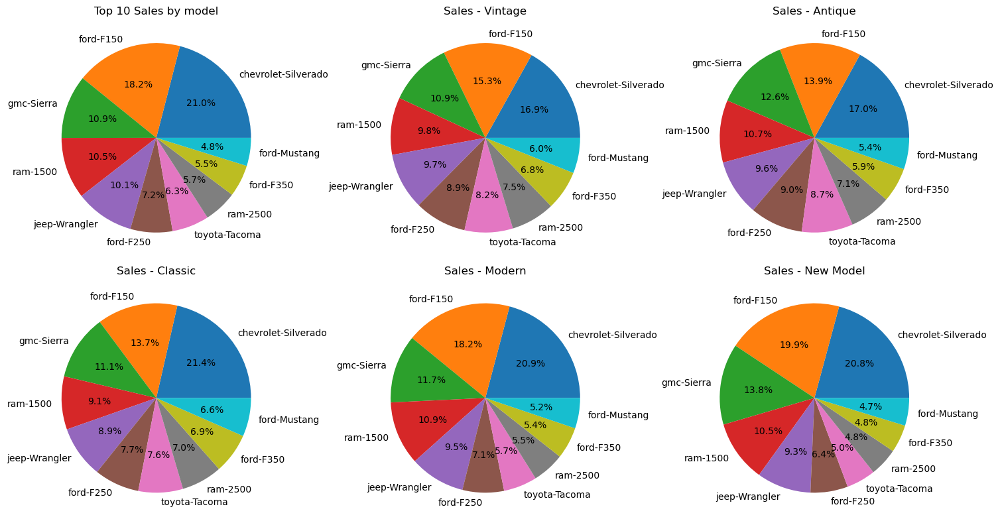

In [76]:
# Evaluating top 10 models

fig, ax = plt.subplots(2, 3, figsize = (15, 8))  # Rows, Columns, Figure size

# Original Plot
df_sales_by_model = df.groupby(['manufacturer', 'model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
ax[0][0].set_title('Top 10 Sales by model')
ax[0][0].pie(
    df_sales_by_model['price'], 
	labels= df_sales_by_model['manufacturer'] + '-' + df_sales_by_model['model'], 
	autopct='%1.1f%%'
)

df_sales_by_q4 = df.query('year_category == "Vintage"').groupby(['manufacturer', 'model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
ax[0][1].set_title('Sales - Vintage')
ax[0][1].pie(
    df_sales_by_q4['price'], 
	labels= df_sales_by_model['manufacturer'] + '-' + df_sales_by_model['model'], 
	autopct='%1.1f%%'
)

df_sales_by_q3 = df.query('year_category == "Antique"').groupby(['manufacturer', 'model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
ax[0][2].set_title('Sales - Antique')
ax[0][2].pie(
    df_sales_by_q3['price'], 
	labels= df_sales_by_model['manufacturer'] + '-' + df_sales_by_model['model'], 
	autopct='%1.1f%%'
)

df_sales_by_q2 = df.query('year_category == "Classic"').groupby(['manufacturer', 'model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
ax[1][0].set_title('Sales - Classic')
ax[1][0].pie(
    df_sales_by_q2['price'], 
	labels= df_sales_by_model['manufacturer'] + '-' + df_sales_by_model['model'], 
	autopct='%1.1f%%'
)

df_sales_by_q2 = df.query('year_category == "Modern"').groupby(['manufacturer', 'model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
ax[1][1].set_title('Sales - Modern')
ax[1][1].pie(
    df_sales_by_q2['price'], 
	labels= df_sales_by_model['manufacturer'] + '-' + df_sales_by_model['model'], 
	autopct='%1.1f%%'
)

df_sales_by_q2 = df.query('year_category == "New Model"').groupby(['manufacturer', 'model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
ax[1][2].set_title('Sales - New Model')
ax[1][2].pie(
    df_sales_by_q2['price'], 
	labels= df_sales_by_model['manufacturer'] + '-' + df_sales_by_model['model'], 
	autopct='%1.1f%%'
)

plt.tight_layout()

#### Sold by Top 10 Models evaluating Odometer

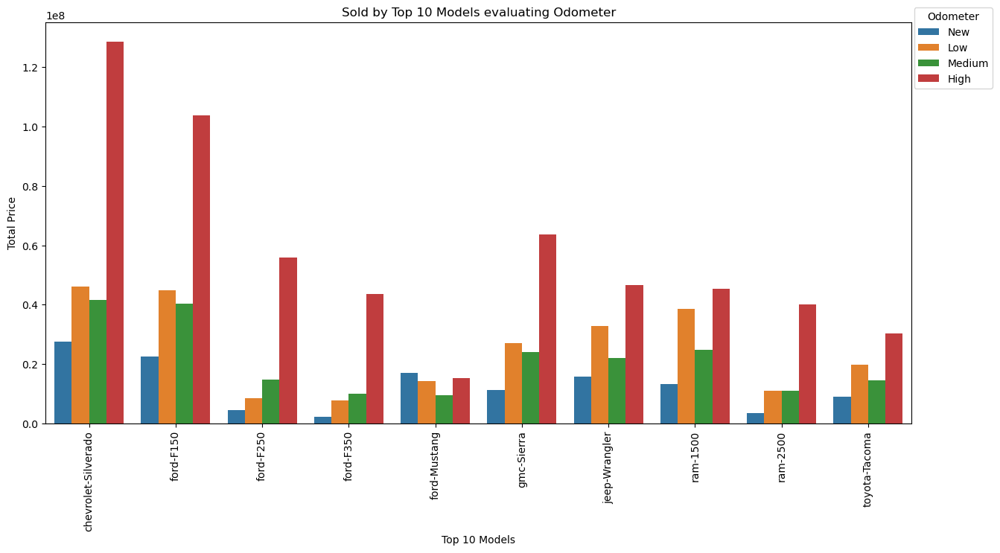

In [77]:
df_new = df.copy()
df_new['man_model'] = df_new['manufacturer'] + '-' + df_new['model']

df_topmodels = df.groupby(['manufacturer', 'model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
df_topmodels['man_model'] = df_topmodels['manufacturer'] + '-' + df_topmodels['model']

top_models = df_topmodels['man_model'].unique()

df_data = df_new.query('man_model in(@top_models)').groupby(['man_model', 'odometer_category'])['price'].sum().reset_index()


plt.figure(figsize = (15, 7))
sns.barplot(df_data, x = "man_model", y="price", hue = "odometer_category").set(title = "Sold by Top 10 Models evaluating Odometer")
plt.xticks(rotation = 90)
plt.xlabel('Top 10 Models')
plt.ylabel('Total Price')
plt.legend(bbox_to_anchor=(1.1, 1.05), title="Odometer")
plt.show()

#### Evaluating 2018 (Year with most sales) and the distribution of top models & Odometer

,man_model,odometer_category,price
0,alfa-romeo-Romeo,New,2393106
1,alfa-romeo-Romeo,Low,6516579
2,alfa-romeo-Romeo,Medium,626934
3,alfa-romeo-Romeo,High,207342
4,audi-S5,New,0
5,audi-S5,Low,2872873
6,audi-S5,Medium,5528747
7,audi-S5,High,35888
8,chevrolet-Silverado,New,1776966
9,chevrolet-Silverado,Low,6473940


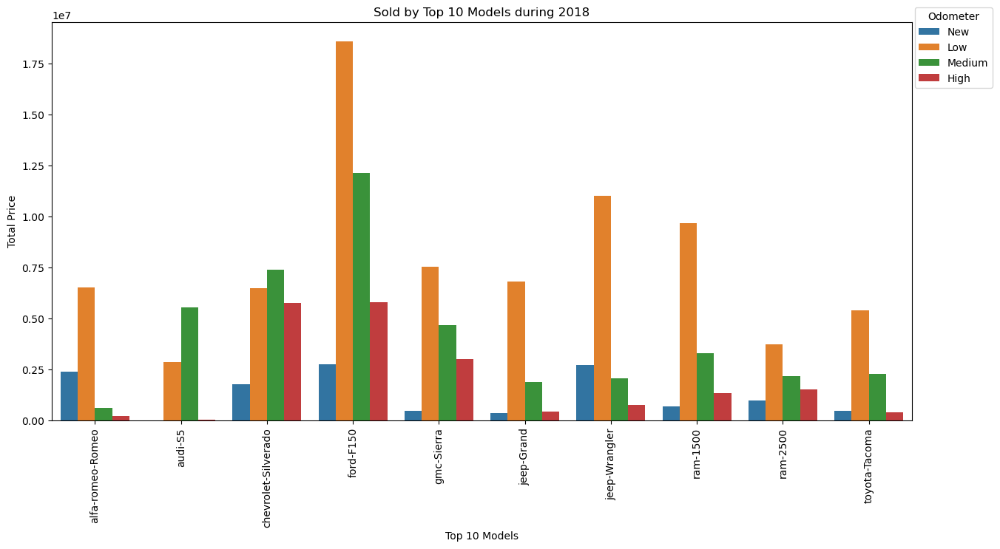

In [78]:
df_new = df.copy()
df_new = df_new.query('year == 2018')
df_new['man_model'] = df_new['manufacturer'] + '-' + df_new['model']

df_topmodels = df_new.groupby(['man_model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
top_models = df_topmodels['man_model'].unique()
df_data = df_new.query('man_model in(@top_models)').groupby(['man_model', 'odometer_category'])['price'].sum().reset_index()

display(df_data)

plt.figure(figsize = (15, 7))
sns.barplot(df_data, x = "man_model", y="price", hue = "odometer_category").set(title = "Sold by Top 10 Models during 2018")
plt.xticks(rotation = 90)
plt.xlabel('Top 10 Models')
plt.ylabel('Total Price')
plt.legend(bbox_to_anchor=(1.1, 1.05), title="Odometer")
plt.show()



#### Sales 2018 by model

([<matplotlib.patches.Wedge at 0x36038aa50>,
 [Text(0.7589321030895784, 0.7962550237832285, 'ford-F150'),
  Text(-0.5174039703868075, 0.9707178433653972, 'chevrolet-Silverado'),
  Text(-1.051236450825035, 0.32388566571675265, 'jeep-Wrangler'),
  Text(-1.0274871884926708, -0.39277229724539764, 'gmc-Sierra'),
  Text(-0.5967784730482844, -0.9240429936459441, 'ram-1500'),
  Text(-0.06998535805483101, -1.0977714013663944, 'alfa-romeo-Romeo'),
  Text(0.3586304105897808, -1.0398962585759242, 'jeep-Grand'),
  Text(0.7103303831061785, -0.8398992480269464, 'toyota-Tacoma'),
  Text(0.9548678398034212, -0.5461020129143898, 'audi-S5'),
  Text(1.083634313003694, -0.189041465506941, 'ram-2500')],
 [Text(0.41396296532158816, 0.43432092206357914, '25.8%'),
  Text(-0.28222034748371316, 0.5294824600174893, '14.1%'),
  Text(-0.5734017004500189, 0.17666490857277417, '10.8%'),
  Text(-0.5604475573596386, -0.21423943486112595, '10.3%'),
  Text(-0.3255155307536096, -0.5040234510796059, '9.8%'),
  Text(-0.0381

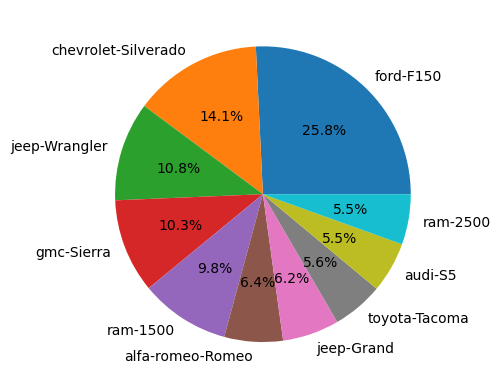

In [92]:
df_2018_top = df_data.groupby('man_model')['price'].agg(sum).reset_index().sort_values('price', ascending=False)

plt.pie(
    df_2018_top['price'], 
	labels= df_2018_top['man_model'], 
	autopct='%1.1f%%'
)